# Canadian Seasonal to Inter-annual Prediction System (CanSIPS)

In this example, we will complete the following:

1) Download the monthly forecasts for 500mb Geopotential Height.
2) Calculate the ensemble mean between all 40 ensemble members.
3) Plot the monthly ensemble mean forecasts for 500mb Geopotential Height.
4) Download the monthly forecasts for 850mb temperature.
5) Calculate the ensemble mean between all 40 ensemble members.
6) Plot the monthly ensemble mean forecasts for 850mb temperature.
7) Download the 30-year CanSIPS Hindcast for the current month for both 500mb Geopotential Height & 850mb Temperature
   ~ These Hindcast clients download the data corresponding to the month of the current model run and calculate a 30-year ensemble mean across 40 members.
   ~ This Hindcast data is used to calculate anomalies.
   ~ The methodogy here follows the methodology described [here](https://eccc-msc.github.io/open-data/msc-data/nwp_cansips/readme_cansips-datamart_en/#:~:text=above%2090%20percentile-,Tips,-for%20Computing%20Anomaly)

8) Plot the forecast 500mb Geopotential Height Anomalies
9) Plot the forecast 850mb Temperature Anomalies.

All plots will be for CONUS & Southern Canada.

[***WxData CanSIPS Forecast Client Documentation***](https://edrewitz.github.io/WxData/cansips)

[***WxData CanSIPS Hindcast Client Documentation***](https://edrewitz.github.io/WxData/cansips%20hindcast)

## Imports

In [1]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import metpy.plots as mpplots
import pandas as pd
import matplotlib.patches as mpatches

from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patheffects import withStroke 
from datetime import timedelta
from wxdata import(
    cansips_forecast,
    cansips_hindcast
)

# IPython magic command used in Jupyter Notebooks to display plots directly below the code cell that generates them
%matplotlib inline

### WxData CanSIPS Forecast Client

```python
def cansips_forecast(western_bound=-180,
            eastern_bound=180,
            northern_bound=90,
            southern_bound=-90,
            variable='geopotential height',
            level=500,
            level_type='pressure',
            period='monthly',
            category=None,
            proxies=None,
            path=f"CanSIPS/Forecast/Geopotential Height/500mb/Monthly",
            chunk_size=8192,
            notifications='off',
            clear_data=False,
            clear_recycle_bin=False,
            convert_temperature=True,
            convert_to='celsius',
            process_data=True):
```


## Downloading Monthly 500 mb Geopotential Height Forecast

The default settings assume the user is downloading the monthly 500 mb geopotential height forecast. 

We still need to change our bounds to subset the data for the area we want to analyze.

In [2]:
height_forecast = cansips_forecast(western_bound=-141,
                                    eastern_bound=-50,
                                    southern_bound=20,
                                    northern_bound=60)

Scanning https://dd.weather.gc.ca/ for the latest requested data.
Please Wait...
Server Scan Complete!


202608_MSC_CanSIPS_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.82M [00:00<?, ?B…

202608_MSC_CanSIPS_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00:00<?, ?B…

202608_MSC_CanSIPS_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.85M [00:00<?, ?B…

202608_MSC_CanSIPS_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00:00<?, ?B…

202608_MSC_CanSIPS_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00:00<?, ?B…

202608_MSC_CanSIPS_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00:00<?, ?B…

202608_MSC_CanSIPS_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00:00<?, ?B…

202608_MSC_CanSIPS_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.92M [00:00<?, ?B…

202608_MSC_CanSIPS_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.88M [00:00<?, ?B…

202608_MSC_CanSIPS_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.86M [00:00<?, ?B…

202608_MSC_CanSIPS_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.85M [00:00<?, ?B…

202608_MSC_CanSIPS_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.82M [00:00<?, ?B…

CanSIPS Download Complete!
Data Processing...
CanSIPS Forecast Data Processing Complete!


## Inspecting Our Data

In [3]:
height_forecast

<xarray.Dataset> Size: 7MB
Dimensions:              (number: 40, step: 12, latitude: 40, longitude: 91)
Coordinates:
  * number               (number) int64 320B 1 2 3 4 5 6 7 ... 35 36 37 38 39 40
  * step                 (step) float64 96B 0.0 720.0 ... 7.2e+03 7.92e+03
  * latitude             (latitude) float64 320B 20.5 21.5 22.5 ... 58.5 59.5
  * longitude            (longitude) float64 728B -140.5 -139.5 ... -51.5 -50.5
    time                 datetime64[ns] 8B ...
    isobaricInhPa        float64 8B ...
    valid_time           datetime64[ns] 8B ...
Data variables:
    geopotential_height  (step, number, latitude, longitude) float32 7MB dask.array<chunksize=(1, 40, 40, 91), meta=np.ndarray>
Attributes:
    GRIB_edition:            2
    GRIB_centre:             cwao
    GRIB_centreDescription:  Canadian Meteorological Service - Montreal
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             Canadian Meteorological Service - Montreal
    history:                 2026-08-29T05:54 GRIB to CDM+CF via cfgrib-0.9.1...

## Finding The Ensemble Mean

In the next cell, we will use xarray to find our ensemble mean for the 500 mb geopotential height forecast between the 40 ensemble members

In [4]:
# Calculating our ensemble mean
height_forecast = height_forecast.mean(dim='number')

In [5]:
# Notice how now our dataset has 3 coords (step, latitude, longitude) rather than the 4 coords before taking the mean (step, number, latitude, longitude)
height_forecast

<xarray.Dataset> Size: 176kB
Dimensions:              (step: 12, latitude: 40, longitude: 91)
Coordinates:
  * step                 (step) float64 96B 0.0 720.0 ... 7.2e+03 7.92e+03
  * latitude             (latitude) float64 320B 20.5 21.5 22.5 ... 58.5 59.5
  * longitude            (longitude) float64 728B -140.5 -139.5 ... -51.5 -50.5
    time                 datetime64[ns] 8B ...
    isobaricInhPa        float64 8B ...
    valid_time           datetime64[ns] 8B ...
Data variables:
    geopotential_height  (step, latitude, longitude) float32 175kB dask.array<chunksize=(1, 40, 91), meta=np.ndarray>
Attributes:
    GRIB_edition:            2
    GRIB_centre:             cwao
    GRIB_centreDescription:  Canadian Meteorological Service - Montreal
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             Canadian Meteorological Service - Montreal
    history:                 2026-08-29T05:54 GRIB to CDM+CF via cfgrib-0.9.1...

## Plotting CanSIPS Monthly 500 mb Geopotential Height Ensemble Mean Forecast

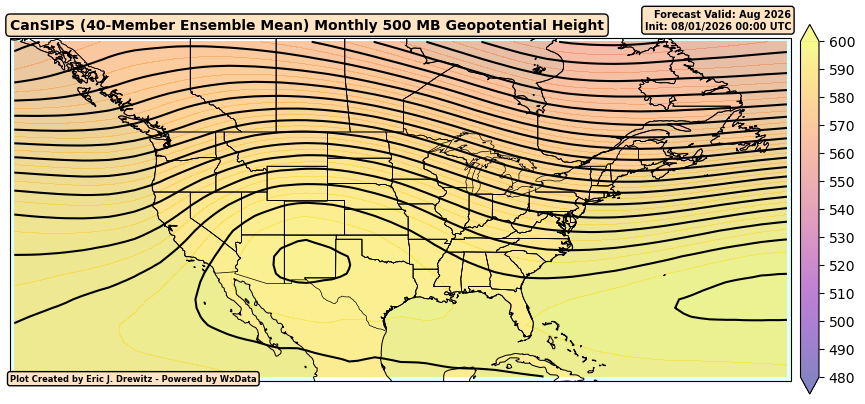

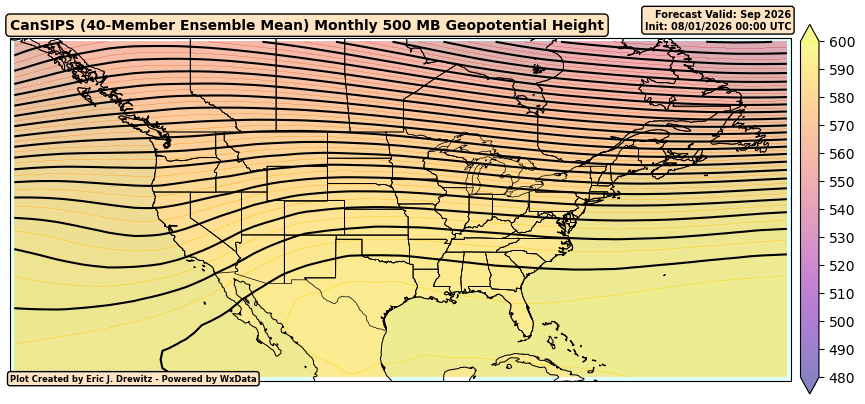

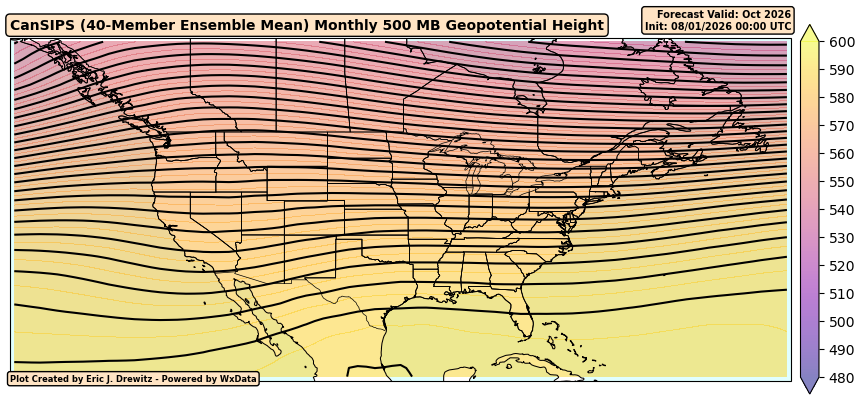

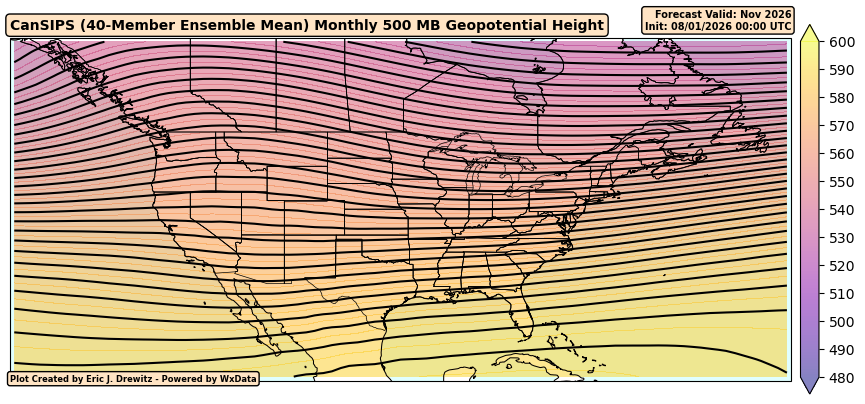

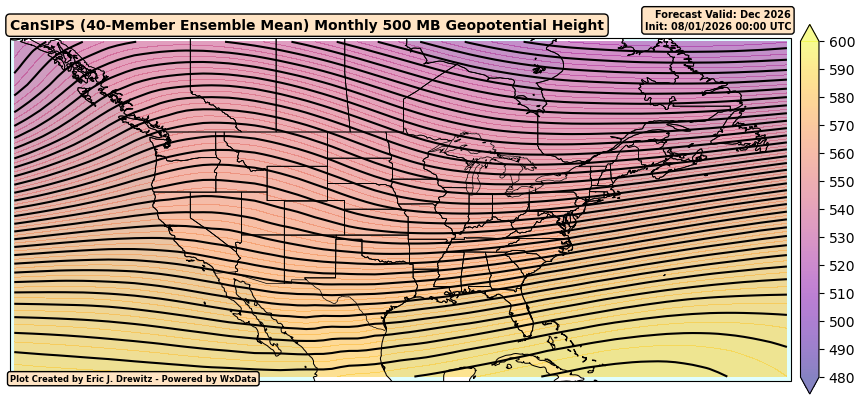

...

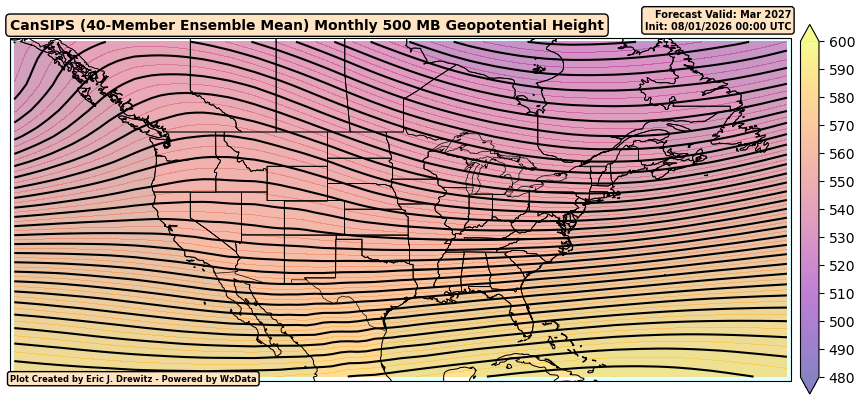

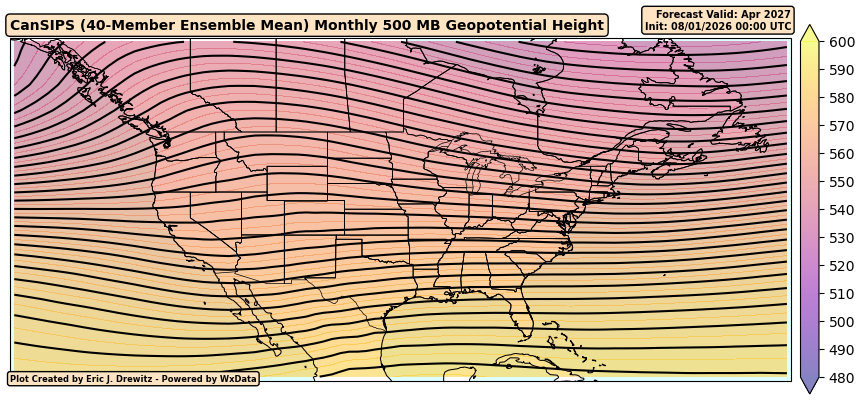

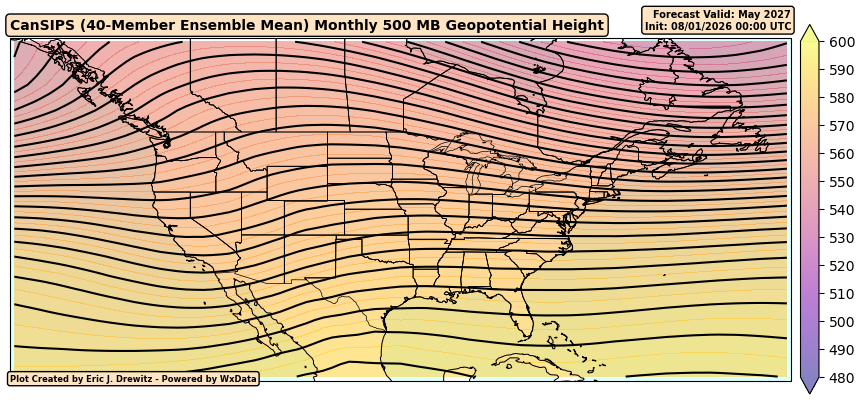

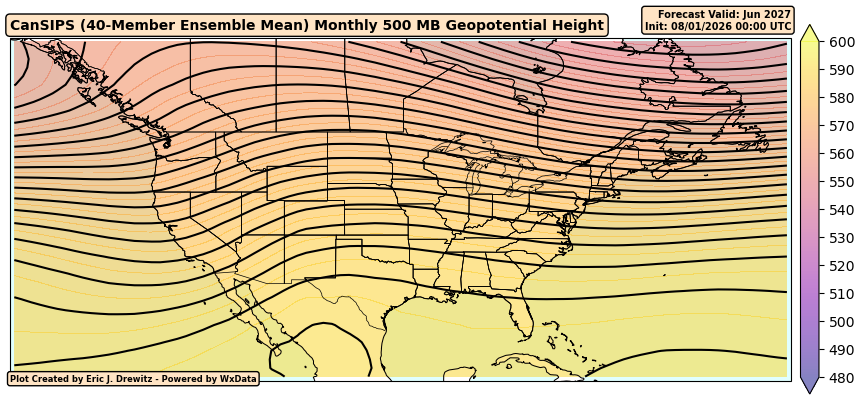

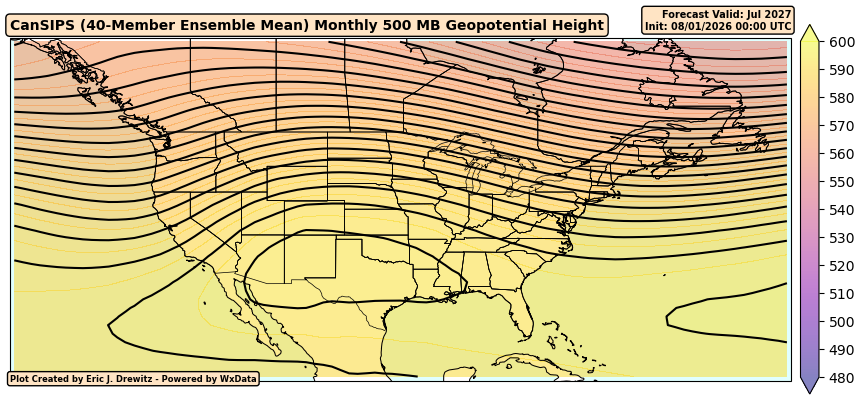

In [6]:
# Create our figure
for i in range(0, len(height_forecast['step']), 1):
    fig = plt.figure(figsize=(12,12))
    
    # Create our subplot with a PlateCarree (lat/lon) projection
    ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree())
    
    # Set our boundaries in a latlon format of [western_bound, eastern_bound, southern_bound, northern_bound] followed by our PlateCarree projection
    ax.set_extent([-141, -50, 20, 60], ccrs.PlateCarree())
    
    # Add our features to the map 
    # Add our coastlines
    ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.75, zorder=3)
    
    # Add the oceans, land, states, lakes and Canadian provinces and color them light cyan
    ax.add_feature(cfeature.OCEAN, color='lightcyan', zorder=1)
    ax.add_feature(cfeature.LAKES, color='lightcyan', zorder=1)
    ax.add_feature(cfeature.LAND, color='white', zorder=1)
    ax.add_feature(cfeature.STATES, edgecolor='black', linewidth=0.5, zorder=5)
    province_boundaries = cfeature.NaturalEarthFeature(
        category="cultural",
        name="admin_1_states_provinces_lines",
        scale="50m",
        facecolor="none",
        edgecolor="black",
    )
    ax.add_feature(province_boundaries, linewidth=0.5, zorder=5)

    # Plot our contour data for 500mb geopotential height (Dm)
    ax.contour(height_forecast['longitude'], 
                height_forecast['latitude'], 
                (height_forecast['geopotential_height'][i, :, :]/10), 
                transform=ccrs.PlateCarree(),
                levels=np.arange(480, 602, 2),
                zorder=2,
                alpha=1,
                colors='black')
    
    # Add our filled contours for 500mb geopotential height (Dm)
    cs = ax.contourf(height_forecast['longitude'], 
                   height_forecast['latitude'], 
                   (height_forecast['geopotential_height'][i, :, :]/10), 
                   levels=np.arange(480, 601, 1),  
                   transform=ccrs.PlateCarree(),
                   alpha=0.5,
                   cmap='plasma',
                   extend='both')
    
    # Create our colorbar of our filled contours for 500mb geopotential height (Dm)
    fig.colorbar(cs, 
                 shrink=0.4, 
                 pad=0.01,
                 ticks=np.arange(480, 610, 10))
    
    # Plot title
    plt.title(f"CanSIPS (40-Member Ensemble Mean) Monthly 500 MB Geopotential Height", 
                   fontsize=10, 
                   fontweight='bold',
                   bbox=dict(boxstyle='round', 
                                facecolor='bisque'),
                   loc='left')
    
    # Extract our valid time as a datetime object
    valid_time = pd.to_datetime(height_forecast['valid_time'].values)
    
    # Gets our new forecast hour (eventhough we are plotting the initial frame)
    times = height_forecast['step'].values
    # The steps are fixed at an interval of 720 hours, however - a month is not a fixed 720 hour period.
    # To correct this, let's add an additional 720 hours to each step to ensure no repeating months
    # The files go from month 0 through month 11
    forecast_time = valid_time + timedelta(hours=(int(times[i]) + 720))
    
    # Secondary title for our model runtime
    plt.title(f"Forecast Valid: {forecast_time.strftime('%b %Y')}\nInit: {valid_time.strftime('%m/%d/%Y %H:00')} UTC", 
                    fontsize=7, 
                    fontweight='bold',
                    bbox=dict(boxstyle='round', 
                                facecolor='bisque'),
                     loc='right')

    # Adding my signature on the plot
    ax.text(0, 
            -0.001, 
            f"Plot Created by Eric J. Drewitz - Powered by WxData", 
            transform=ax.transAxes, 
            fontsize=6, 
            fontweight='bold', 
            bbox=dict(boxstyle='round', 
                    facecolor='bisque'))

    plt.show()
             

## Downloading Monthly 850 mb Temperature Forecast

The default settings assume the user is downloading the monthly 500 mb geopotential height forecast. 

We still need to change our variable, level and bounds to subset the data for the area we want to analyze.

In [7]:
temperature_forecast = cansips_forecast(western_bound=-141,
                eastern_bound=-50,
                southern_bound=20,
                northern_bound=60,
                variable='temperature',
                level=850,
                path=f"CanSIPS/Forecast/Temperature/850mb/Monthly")

Scanning https://dd.weather.gc.ca/ for the latest requested data.
Please Wait...
Server Scan Complete!


202608_MSC_CanSIPS_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s]

202608_MSC_CanSIPS_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s]

202608_MSC_CanSIPS_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s]

202608_MSC_CanSIPS_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.28M [00:00<?, ?B/s]

202608_MSC_CanSIPS_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.20M [00:00<?, ?B/s]

202608_MSC_CanSIPS_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s]

202608_MSC_CanSIPS_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s]

202608_MSC_CanSIPS_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s]

202608_MSC_CanSIPS_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s]

202608_MSC_CanSIPS_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s]

202608_MSC_CanSIPS_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s]

202608_MSC_CanSIPS_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s]

CanSIPS Download Complete!
Data Processing...
CanSIPS Forecast Data Processing Complete!


## Inspecting Our Data

In [8]:
temperature_forecast

<xarray.Dataset> Size: 7MB
Dimensions:        (number: 40, step: 12, latitude: 40, longitude: 91)
Coordinates:
  * number         (number) int64 320B 1 2 3 4 5 6 7 8 ... 34 35 36 37 38 39 40
  * step           (step) float64 96B 0.0 720.0 1.44e+03 ... 7.2e+03 7.92e+03
  * latitude       (latitude) float64 320B 20.5 21.5 22.5 ... 57.5 58.5 59.5
  * longitude      (longitude) float64 728B -140.5 -139.5 -138.5 ... -51.5 -50.5
    time           datetime64[ns] 8B ...
    isobaricInhPa  float64 8B ...
    valid_time     datetime64[ns] 8B ...
Data variables:
    temperature    (step, number, latitude, longitude) float32 7MB dask.array<chunksize=(1, 40, 40, 91), meta=np.ndarray>
Attributes:
    GRIB_edition:            2
    GRIB_centre:             cwao
    GRIB_centreDescription:  Canadian Meteorological Service - Montreal
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             Canadian Meteorological Service - Montreal
    history:                 2026-08-29T05:55 GRIB to CDM+CF via cfgrib-0.9.1...

## Finding The Ensemble Mean

In the next cell, we will use xarray to find our ensemble mean for the 850 mb temperature forecast between the 40 ensemble members

In [9]:
# Calculating our ensemble mean
temperature_forecast = temperature_forecast.mean(dim='number')

In [10]:
temperature_forecast

<xarray.Dataset> Size: 176kB
Dimensions:        (step: 12, latitude: 40, longitude: 91)
Coordinates:
  * step           (step) float64 96B 0.0 720.0 1.44e+03 ... 7.2e+03 7.92e+03
  * latitude       (latitude) float64 320B 20.5 21.5 22.5 ... 57.5 58.5 59.5
  * longitude      (longitude) float64 728B -140.5 -139.5 -138.5 ... -51.5 -50.5
    time           datetime64[ns] 8B ...
    isobaricInhPa  float64 8B ...
    valid_time     datetime64[ns] 8B ...
Data variables:
    temperature    (step, latitude, longitude) float32 175kB dask.array<chunksize=(1, 40, 91), meta=np.ndarray>
Attributes:
    GRIB_edition:            2
    GRIB_centre:             cwao
    GRIB_centreDescription:  Canadian Meteorological Service - Montreal
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             Canadian Meteorological Service - Montreal
    history:                 2026-08-29T05:55 GRIB to CDM+CF via cfgrib-0.9.1...

## Plotting CanSIPS Monthly 850 mb Temperature Ensemble Mean Forecast

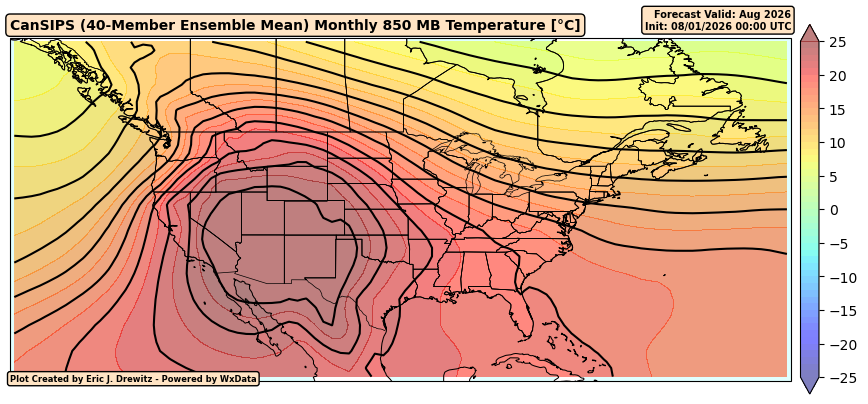

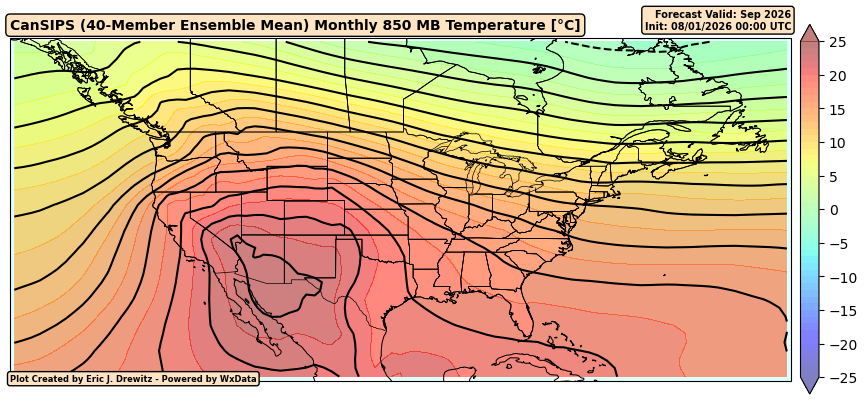

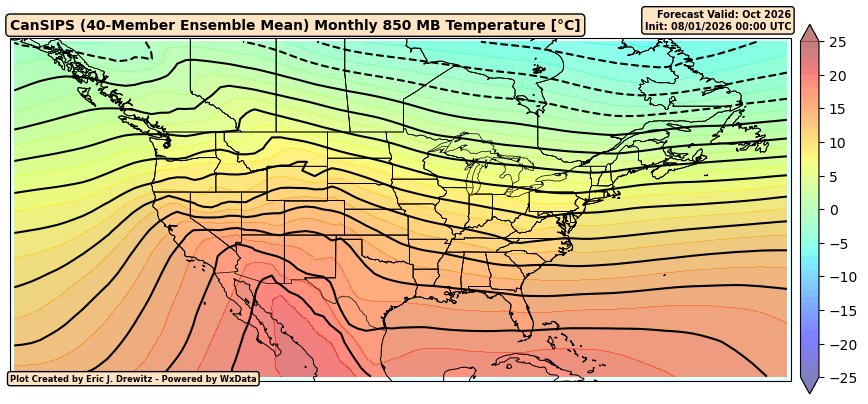

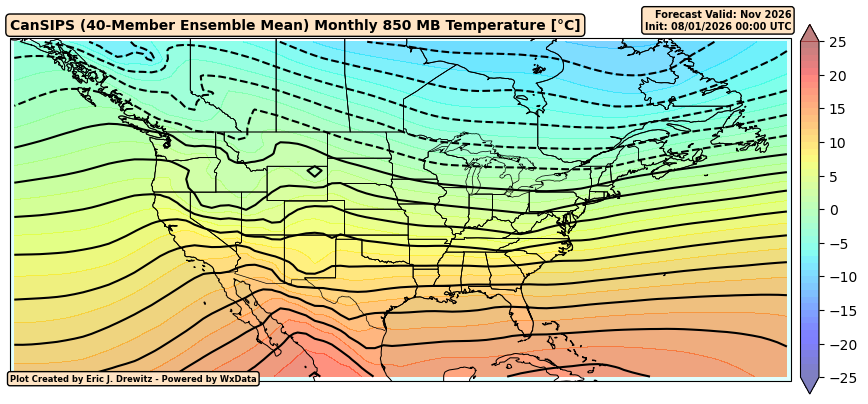

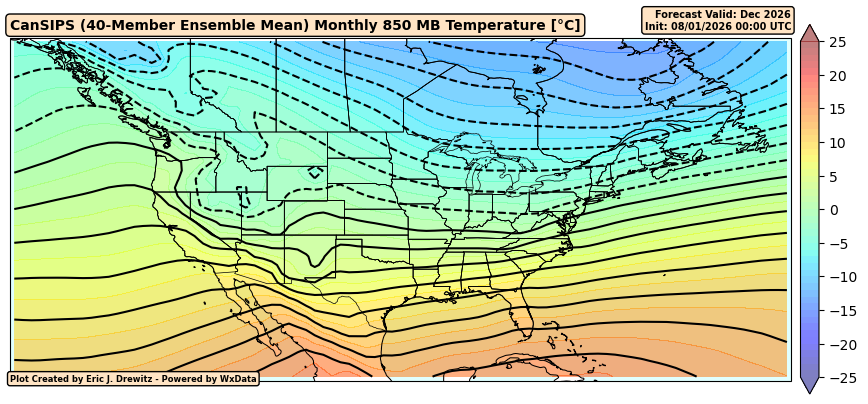

...

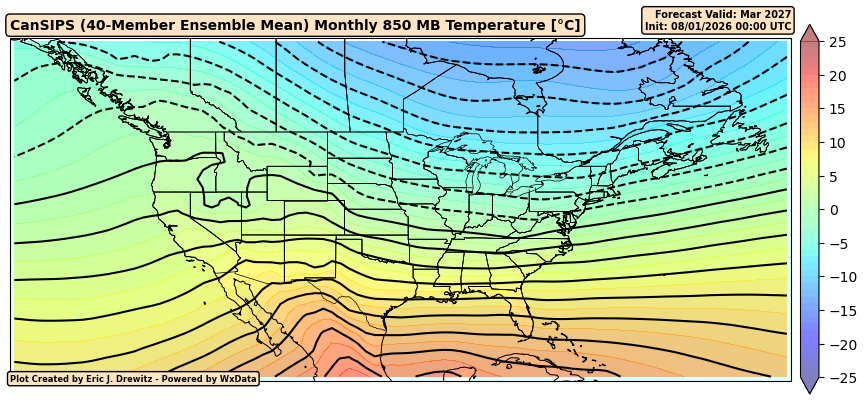

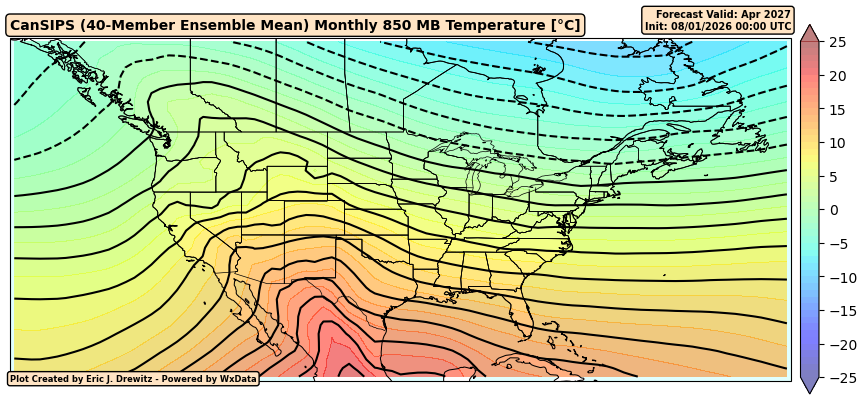

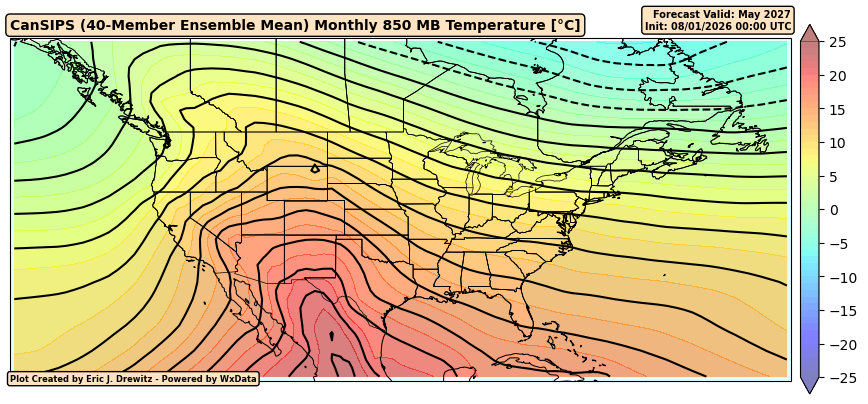

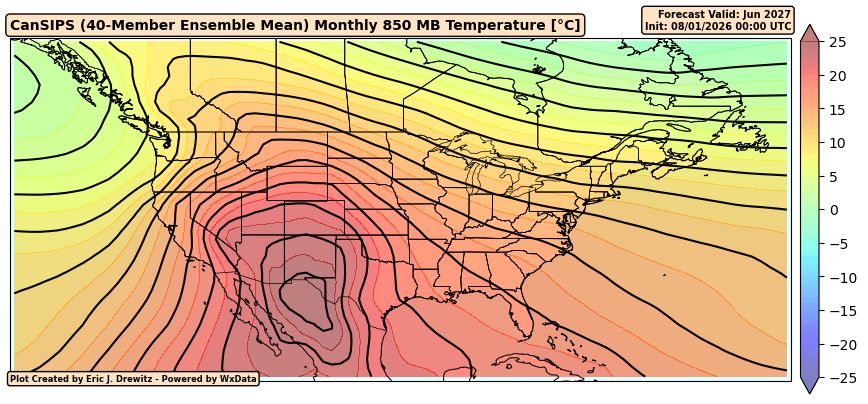

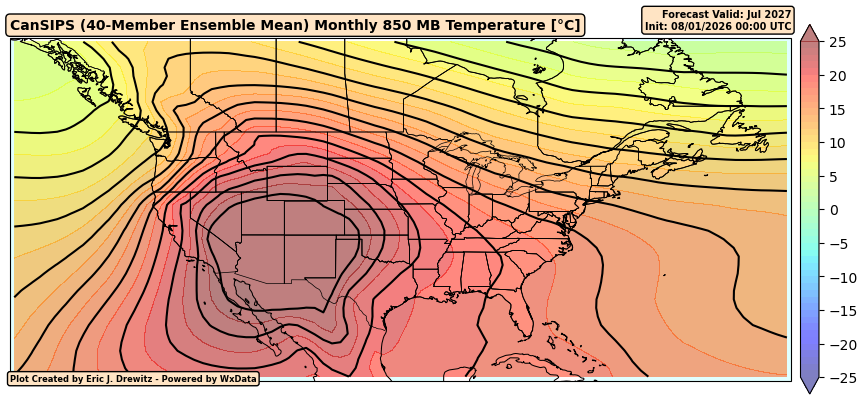

In [11]:
# Create our figure
for i in range(0, len(temperature_forecast['step']), 1):
    fig = plt.figure(figsize=(12,12))
    
    # Create our subplot with a PlateCarree (lat/lon) projection
    ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree())
    
    # Set our boundaries in a latlon format of [western_bound, eastern_bound, southern_bound, northern_bound] followed by our PlateCarree projection
    ax.set_extent([-141, -50, 20, 60], ccrs.PlateCarree())
    
    # Add our features to the map 
    # Add our coastlines
    ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.75, zorder=3)
    
    # Add the oceans, land, states, lakes and Canadian provinces and color them light cyan
    ax.add_feature(cfeature.OCEAN, color='lightcyan', zorder=1)
    ax.add_feature(cfeature.LAKES, color='lightcyan', zorder=1)
    ax.add_feature(cfeature.LAND, color='white', zorder=1)
    ax.add_feature(cfeature.STATES, edgecolor='black', linewidth=0.5, zorder=5)
    province_boundaries = cfeature.NaturalEarthFeature(
        category="cultural",
        name="admin_1_states_provinces_lines",
        scale="50m",
        facecolor="none",
        edgecolor="black",
    )
    ax.add_feature(province_boundaries, linewidth=0.5, zorder=5)

    # Plot our contour data for 850mb temperature [°C]
    ax.contour(temperature_forecast['longitude'], 
                temperature_forecast['latitude'], 
                temperature_forecast['temperature'][i, :, :], 
                transform=ccrs.PlateCarree(),
                levels=np.arange(-25, 27, 2),
                zorder=2,
                alpha=1,
                colors='black')
    
    # Add our filled contours for 850mb temperature [°C]
    cs = ax.contourf(temperature_forecast['longitude'], 
                   temperature_forecast['latitude'], 
                   temperature_forecast['temperature'][i, :, :], 
                   levels=np.arange(-25, 26, 1),  
                   transform=ccrs.PlateCarree(),
                   alpha=0.5,
                   cmap='jet',
                   extend='both')
    
    # Create our colorbar of our filled contours for 850mb temperature [°C]
    fig.colorbar(cs, 
                 shrink=0.4, 
                 pad=0.01,
                 ticks=np.arange(-25, 30, 5))
    
    # Plot title
    plt.title(f"CanSIPS (40-Member Ensemble Mean) Monthly 850 MB Temperature [°C]", 
                   fontsize=10, 
                   fontweight='bold',
                   bbox=dict(boxstyle='round', 
                                facecolor='bisque'),
                   loc='left')
    
    # Extract our valid time as a datetime object
    valid_time = pd.to_datetime(temperature_forecast['valid_time'].values)
    
    # Gets our new forecast hour (eventhough we are plotting the initial frame)
    times = temperature_forecast['step'].values
    # The steps are fixed at an interval of 720 hours, however - a month is not a fixed 720 hour period.
    # To correct this, let's add an additional 720 hours to each step to ensure no repeating months
    # The files go from month 0 through month 11
    forecast_time = valid_time + timedelta(hours=(int(times[i]) + 720))
    # Secondary title for our model runtime
    plt.title(f"Forecast Valid: {forecast_time.strftime('%b %Y')}\nInit: {valid_time.strftime('%m/%d/%Y %H:00')} UTC", 
                    fontsize=7, 
                    fontweight='bold',
                    bbox=dict(boxstyle='round', 
                                facecolor='bisque'),
                     loc='right')

    # Adding my signature on the plot
    ax.text(0, 
            -0.001, 
            f"Plot Created by Eric J. Drewitz - Powered by WxData", 
            transform=ax.transAxes, 
            fontsize=6, 
            fontweight='bold', 
            bbox=dict(boxstyle='round', 
                    facecolor='bisque'))

    plt.show()

### WxData CanSIPS Hindcast Client

```python
def cansips_hindcast(western_bound=-180,
                     eastern_bound=180,
                     northern_bound=90,
                     southern_bound=-90,
                     level_type='pressure',
                     level=500,
                     variable='geopotential height',
                     proxies=None,
                     clear_recycle_bin=False,
                     convert_temperature=True,
                     convert_to='celsius',
                     process_data=True,
                     path=f"CanSIPS/Hindcast",
                     chunk_size=8192,
                     notifications='off',
                     clear_data=False):
```

## Downloading Monthly 500 mb Geopotential Height Hindcast

The default settings assume the user is downloading the monthly 500 mb geopotential height hindcast. 

We still need to change our bounds to subset the data for the area we want to analyze.

In [12]:
height_hindcast = cansips_hindcast(western_bound=-141,
                                    eastern_bound=-50,
                                    southern_bound=20,
                                    northern_bound=60)

Scanning https://dd.weather.gc.ca/ for the latest requested data.
Please Wait...
Server Scan Complete!


199108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.83M [00…

199108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00…

199108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.84M [00…

199108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

199108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

199108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

199108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

199108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

199108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.91M [00…

199108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.90M [00…

199108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.88M [00…

199108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

199208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.84M [00…

199208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.83M [00…

199208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.85M [00…

199208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.94M [00…

199208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.95M [00…

199208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

199208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

199208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

199208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.92M [00…

199208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.89M [00…

199208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.89M [00…

199208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

199308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.84M [00…

199308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00…

199308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.86M [00…

199308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

199308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.95M [00…

199308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.94M [00…

199308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

199308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.95M [00…

199308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.91M [00…

199308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.88M [00…

199308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.87M [00…

199308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

199408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.84M [00…

199408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00…

199408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.86M [00…

199408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

199408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

199408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

199408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

199408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.95M [00…

199408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.91M [00…

199408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.89M [00…

199408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.86M [00…

199408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

199508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.84M [00…

199508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.81M [00…

199508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.84M [00…

199508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

199508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

199508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.94M [00…

199508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

199508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.95M [00…

199508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.91M [00…

199508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.89M [00…

199508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.87M [00…

199508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

199608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.84M [00…

199608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.83M [00…

199608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.87M [00…

199608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.94M [00…

199608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.95M [00…

199608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

199608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

199608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.95M [00…

199608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.92M [00…

199608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.87M [00…

199608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.85M [00…

199608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.85M [00…

199708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.84M [00…

199708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.83M [00…

199708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.86M [00…

199708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.94M [00…

199708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

199708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

199708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

199708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.93M [00…

199708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.89M [00…

199708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.87M [00…

199708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.86M [00…

199708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.82M [00…

199808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.83M [00…

199808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.81M [00…

199808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.83M [00…

199808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

199808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

199808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

199808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

199808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

199808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.90M [00…

199808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.89M [00…

199808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.87M [00…

199808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

199908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.83M [00…

199908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.81M [00…

199908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.84M [00…

199908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

199908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

199908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

199908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.95M [00…

199908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

199908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.91M [00…

199908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.89M [00…

199908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.85M [00…

199908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.83M [00…

200008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.83M [00…

200008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00…

200008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.86M [00…

200008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

200008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

200008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

200008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

200008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.95M [00…

200008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.91M [00…

200008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.89M [00…

200008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.87M [00…

200008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

200108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.83M [00…

200108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00…

200108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.84M [00…

200108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

200108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.95M [00…

200108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

200108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

200108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.95M [00…

200108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.90M [00…

200108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.87M [00…

200108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.86M [00…

200108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.83M [00…

200208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.83M [00…

200208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00…

200208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.86M [00…

200208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.94M [00…

200208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.95M [00…

200208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

200208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

200208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

200208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.90M [00…

200208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.88M [00…

200208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.86M [00…

200208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

200308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.84M [00…

200308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.81M [00…

200308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.83M [00…

200308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.92M [00…

200308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

200308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

200308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

200308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

200308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.90M [00…

200308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.87M [00…

200308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.86M [00…

200308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.83M [00…

200408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.84M [00…

200408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.83M [00…

200408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.87M [00…

200408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.94M [00…

200408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

200408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

200408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

200408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.95M [00…

200408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.90M [00…

200408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.87M [00…

200408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.87M [00…

200408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.83M [00…

200508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.83M [00…

200508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00…

200508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.83M [00…

200508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.92M [00…

200508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

200508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

200508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

200508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.95M [00…

200508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.91M [00…

200508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.86M [00…

200508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.85M [00…

200508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

200608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.83M [00…

200608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00…

200608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.83M [00…

200608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

200608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

200608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

200608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

200608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

200608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.90M [00…

200608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.87M [00…

200608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.85M [00…

200608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

200708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.84M [00…

200708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00…

200708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.85M [00…

200708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

200708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.95M [00…

200708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

200708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

200708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

200708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.90M [00…

200708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.88M [00…

200708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.86M [00…

200708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

200808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.83M [00…

200808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00…

200808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.83M [00…

200808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

200808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

200808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

200808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

200808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

200808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.91M [00…

200808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.87M [00…

200808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.86M [00…

200808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

200908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.84M [00…

200908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.81M [00…

200908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.84M [00…

200908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

200908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.95M [00…

200908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

200908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

200908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

200908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.89M [00…

200908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.87M [00…

200908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.85M [00…

200908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

201008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.82M [00…

201008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.81M [00…

201008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.83M [00…

201008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.92M [00…

201008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

201008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

201008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

201008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

201008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.91M [00…

201008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.89M [00…

201008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.88M [00…

201008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.83M [00…

201108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.86M [00…

201108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00…

201108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.86M [00…

201108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

201108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

201108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

201108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

201108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.95M [00…

201108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.92M [00…

201108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.88M [00…

201108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.87M [00…

201108_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

201208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.84M [00…

201208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.83M [00…

201208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.85M [00…

201208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.92M [00…

201208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

201208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

201208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

201208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

201208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.89M [00…

201208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.86M [00…

201208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.85M [00…

201208_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.85M [00…

201308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.83M [00…

201308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.81M [00…

201308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.84M [00…

201308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.92M [00…

201308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

201308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

201308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

201308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

201308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.88M [00…

201308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.86M [00…

201308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.86M [00…

201308_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.82M [00…

201408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.83M [00…

201408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00…

201408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.86M [00…

201408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

201408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

201408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

201408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

201408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

201408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.90M [00…

201408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.85M [00…

201408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.85M [00…

201408_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.85M [00…

201508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.84M [00…

201508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00…

201508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.84M [00…

201508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.92M [00…

201508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

201508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

201508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

201508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.93M [00…

201508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.89M [00…

201508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.85M [00…

201508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.86M [00…

201508_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.83M [00…

201608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.83M [00…

201608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00…

201608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.83M [00…

201608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

201608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.95M [00…

201608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

201608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

201608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

201608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.90M [00…

201608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.88M [00…

201608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.86M [00…

201608_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.83M [00…

201708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.83M [00…

201708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.81M [00…

201708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.85M [00…

201708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.92M [00…

201708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

201708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

201708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

201708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

201708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.91M [00…

201708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.87M [00…

201708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.85M [00…

201708_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

201808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.84M [00…

201808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.81M [00…

201808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.85M [00…

201808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

201808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

201808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

201808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

201808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

201808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.90M [00…

201808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.85M [00…

201808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.85M [00…

201808_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

201908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.83M [00…

201908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.82M [00…

201908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.86M [00…

201908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

201908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

201908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

201908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.95M [00…

201908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

201908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.90M [00…

201908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.88M [00…

201908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.85M [00…

201908_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.84M [00…

202008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P00M.grib2:   0%|          | 0.00/2.82M [00…

202008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P01M.grib2:   0%|          | 0.00/2.81M [00…

202008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P02M.grib2:   0%|          | 0.00/2.83M [00…

202008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P03M.grib2:   0%|          | 0.00/2.93M [00…

202008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P04M.grib2:   0%|          | 0.00/2.94M [00…

202008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P05M.grib2:   0%|          | 0.00/2.95M [00…

202008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P06M.grib2:   0%|          | 0.00/2.96M [00…

202008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P07M.grib2:   0%|          | 0.00/2.94M [00…

202008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P08M.grib2:   0%|          | 0.00/2.92M [00…

202008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P09M.grib2:   0%|          | 0.00/2.88M [00…

202008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P10M.grib2:   0%|          | 0.00/2.86M [00…

202008_MSC_CanSIPS-Hindcast_GeopotentialHeight_ISBL-0500_LatLon1.0_P11M.grib2:   0%|          | 0.00/2.83M [00…

CanSIPS Download Complete!
CanSIPS Hindcast Data Processing Complete!


## Inspecting Our Data

In [13]:
height_hindcast

<xarray.Dataset> Size: 176kB
Dimensions:              (step: 12, latitude: 40, longitude: 91)
Coordinates:
  * step                 (step) float64 96B 0.0 720.0 ... 7.2e+03 7.92e+03
  * latitude             (latitude) float64 320B 20.5 21.5 22.5 ... 58.5 59.5
  * longitude            (longitude) float64 728B -140.5 -139.5 ... -51.5 -50.5
    isobaricInhPa        float64 8B 500.0
    valid_time           datetime64[ns] 8B 1991-08-01
Data variables:
    geopotential_height  (step, latitude, longitude) float32 175kB dask.array<chunksize=(1, 40, 91), meta=np.ndarray>
Attributes:
    GRIB_edition:            2
    GRIB_centre:             cwao
    GRIB_centreDescription:  Canadian Meteorological Service - Montreal
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             Canadian Meteorological Service - Montreal
    history:                 2026-08-29T06:05 GRIB to CDM+CF via cfgrib-0.9.1...

## Plotting CanSIPS Monthly 500 mb Geopotential Height Anomaly Ensemble Mean Forecast

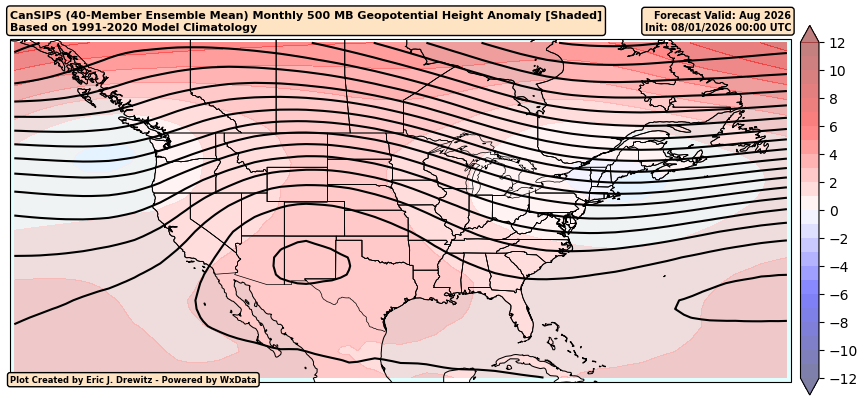

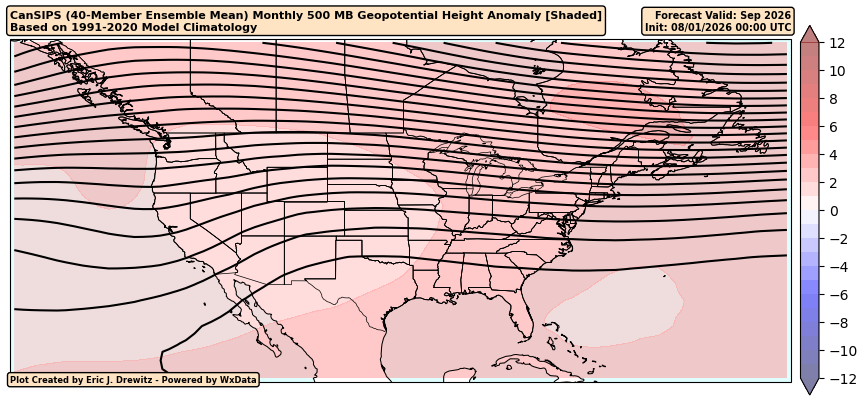

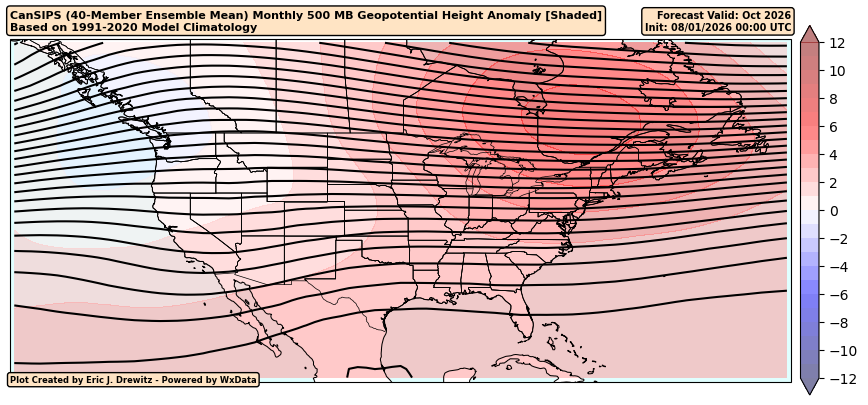

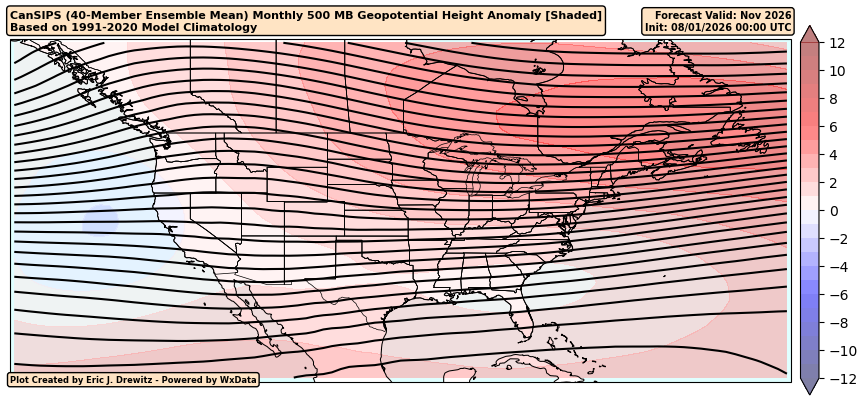

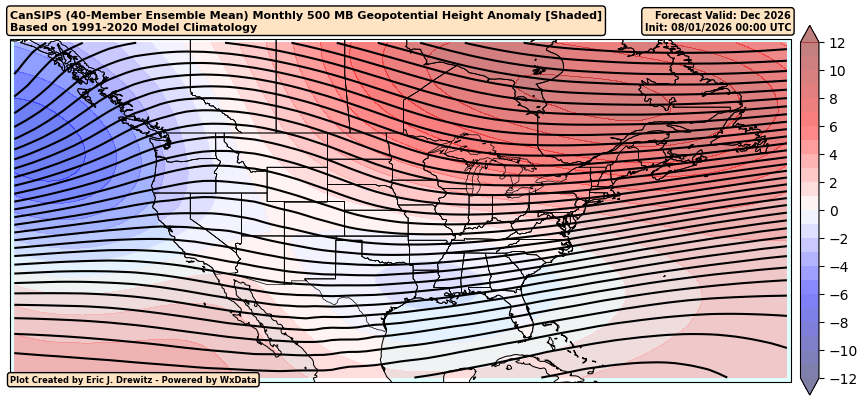

...

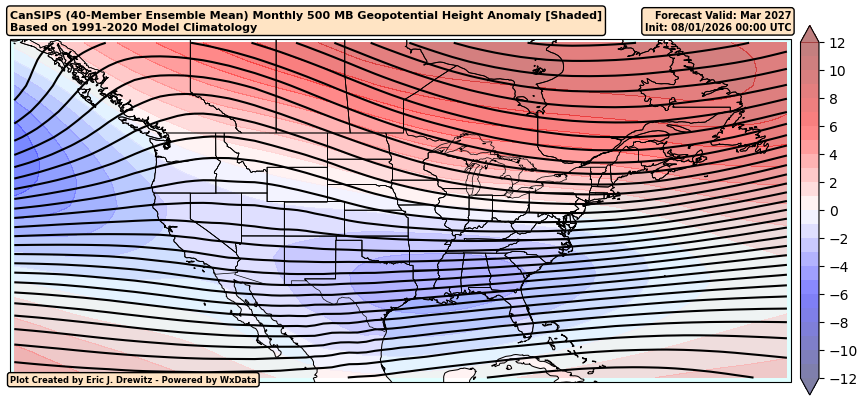

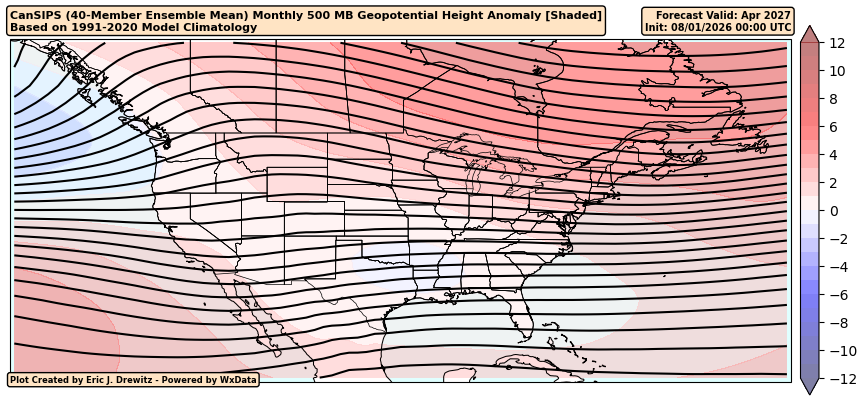

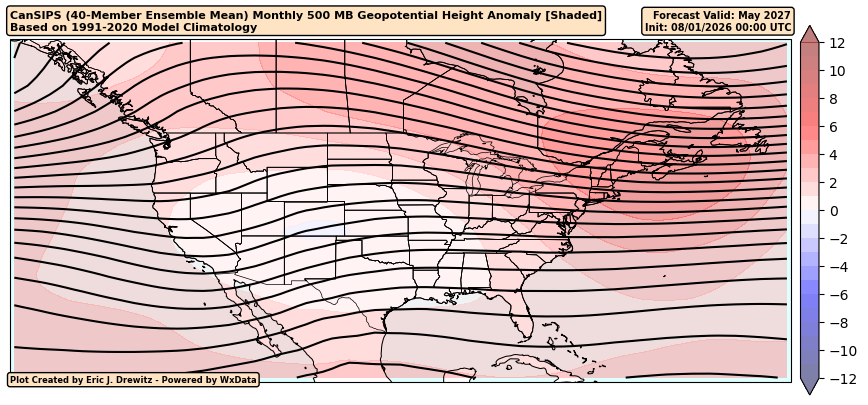

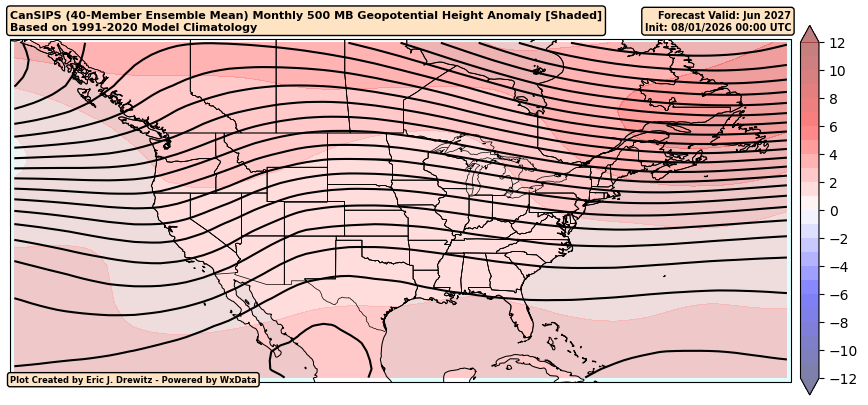

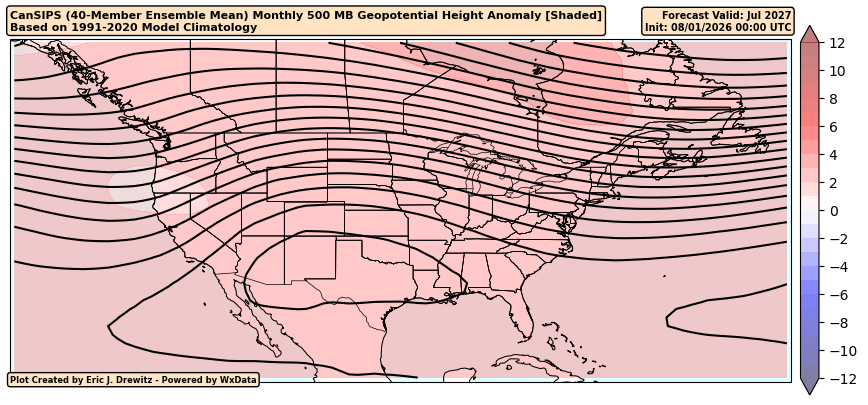

In [14]:
# Create our figure
for i in range(0, len(height_forecast['step']), 1):
    fig = plt.figure(figsize=(12,12))
    
    # Create our subplot with a PlateCarree (lat/lon) projection
    ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree())
    
    # Set our boundaries in a latlon format of [western_bound, eastern_bound, southern_bound, northern_bound] followed by our PlateCarree projection
    ax.set_extent([-141, -50, 20, 60], ccrs.PlateCarree())
    
    # Add our features to the map 
    # Add our coastlines
    ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.75, zorder=3)
    
    # Add the oceans, land, states, lakes and Canadian provinces and color them light cyan
    ax.add_feature(cfeature.OCEAN, color='lightcyan', zorder=1)
    ax.add_feature(cfeature.LAKES, color='lightcyan', zorder=1)
    ax.add_feature(cfeature.LAND, color='white', zorder=1)
    ax.add_feature(cfeature.STATES, edgecolor='black', linewidth=0.5, zorder=5)
    province_boundaries = cfeature.NaturalEarthFeature(
        category="cultural",
        name="admin_1_states_provinces_lines",
        scale="50m",
        facecolor="none",
        edgecolor="black",
    )
    ax.add_feature(province_boundaries, linewidth=0.5, zorder=5)

    # Plot our contour data for the 500mb geopotential height forecast (Dm)
    ax.contour(height_forecast['longitude'], 
                height_forecast['latitude'], 
                (height_forecast['geopotential_height'][i, :, :]/10), 
                transform=ccrs.PlateCarree(),
                levels=np.arange(480, 612, 2),
                zorder=2,
                alpha=1,
                colors='black')
    
    # Add our filled contours of the 500mb gepotential height difference (ΔDm) between the forecast and 1991-2020 climatology
    cs = ax.contourf(height_forecast['longitude'], 
                   height_forecast['latitude'], 
                   (height_forecast['geopotential_height'][i, :, :]/10) - (height_hindcast['geopotential_height'][i, :, :]/10), 
                   levels=np.arange(-12, 13, 1),  
                   transform=ccrs.PlateCarree(),
                   alpha=0.5,
                   cmap='seismic',
                   extend='both')
    
    # Create our colorbar of the 500mb gepotential height difference (ΔDm) between the forecast and 1991-2020 climatology
    fig.colorbar(cs, 
                 shrink=0.4, 
                 pad=0.01,
                 ticks=np.arange(-12, 14, 2))
    
    # Plot title
    plt.title(f"CanSIPS (40-Member Ensemble Mean) Monthly 500 MB Geopotential Height Anomaly [Shaded]\nBased on 1991-2020 Model Climatology", 
                   fontsize=8, 
                   fontweight='bold',
                   bbox=dict(boxstyle='round', 
                                facecolor='bisque'),
                   loc='left')
    
    # Extract our valid time as a datetime object
    valid_time = pd.to_datetime(height_forecast['valid_time'].values)
    
    # Gets our new forecast hour (eventhough we are plotting the initial frame)
    times = height_forecast['step'].values
    # The steps are fixed at an interval of 720 hours, however - a month is not a fixed 720 hour period.
    # To correct this, let's add an additional 720 hours to each step to ensure no repeating months
    # The files go from month 0 through month 11
    forecast_time = valid_time + timedelta(hours=(int(times[i]) + 720))
    
    # Secondary title for our model runtime
    plt.title(f"Forecast Valid: {forecast_time.strftime('%b %Y')}\nInit: {valid_time.strftime('%m/%d/%Y %H:00')} UTC", 
                    fontsize=7, 
                    fontweight='bold',
                    bbox=dict(boxstyle='round', 
                                facecolor='bisque'),
                     loc='right')

    # Adding my signature on the plot
    ax.text(0, 
            -0.001, 
            f"Plot Created by Eric J. Drewitz - Powered by WxData", 
            transform=ax.transAxes, 
            fontsize=6, 
            fontweight='bold', 
            bbox=dict(boxstyle='round', 
                    facecolor='bisque'))

    plt.show()

## Downloading Monthly 850 mb Temperature Forecast

The default settings assume the user is downloading the monthly 500 mb geopotential height forecast. 

We still need to change our variable, level and bounds to subset the data for the area we want to analyze.

In [15]:
temperature_hindcast = cansips_hindcast(western_bound=-141,
                eastern_bound=-50,
                southern_bound=20,
                northern_bound=60,
                variable='temperature',
                level=850,
                path=f"CanSIPS/Hindcast/Temperature/850mb/Monthly")

Scanning https://dd.weather.gc.ca/ for the latest requested data.
Please Wait...
Server Scan Complete!


199108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

199108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.37M [00:00<?, ?B/s…

199108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

199108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.20M [00:00<?, ?B/s…

199108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

199108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

199108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

199108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

199208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.35M [00:00<?, ?B/s…

199208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.20M [00:00<?, ?B/s…

199208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

199208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

199208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

199208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

199208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

199308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.38M [00:00<?, ?B/s…

199308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

199308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

199308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

199308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

199308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

199408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.33M [00:00<?, ?B/s…

199408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.20M [00:00<?, ?B/s…

199408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

199408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

199408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

199408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

199508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.38M [00:00<?, ?B/s…

199508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

199508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

199508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

199508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

199508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

199608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.35M [00:00<?, ?B/s…

199608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

199608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

199608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

199608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

199608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

199608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

199708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.29M [00:00<?, ?B/s…

199708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

199708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

199708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

199708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

199708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

199808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.40M [00:00<?, ?B/s…

199808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

199808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

199808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

199808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

199808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

199908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.39M [00:00<?, ?B/s…

199908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

199908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.20M [00:00<?, ?B/s…

199908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

199908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

199908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

199908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

199908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

199908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

200008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.36M [00:00<?, ?B/s…

200008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

200008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

200008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

200008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

200008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

200108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.39M [00:00<?, ?B/s…

200108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

200108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

200108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

200108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

200208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

200208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.37M [00:00<?, ?B/s…

200208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

200208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

200208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

200208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

200208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

200308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

200308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

200308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.36M [00:00<?, ?B/s…

200308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

200308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

200308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

200308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

200408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

200408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.40M [00:00<?, ?B/s…

200408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

200408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

200408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

200408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

200408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

200508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

200508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.37M [00:00<?, ?B/s…

200508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

200508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

200508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

200608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

200608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.35M [00:00<?, ?B/s…

200608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.20M [00:00<?, ?B/s…

200608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

200608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

200708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

200708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.39M [00:00<?, ?B/s…

200708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

200708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

200708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

200708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

200808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.35M [00:00<?, ?B/s…

200808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

200808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.20M [00:00<?, ?B/s…

200808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

200908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

200908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.36M [00:00<?, ?B/s…

200908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

200908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

200908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

200908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

200908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

200908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

200908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

201008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.41M [00:00<?, ?B/s…

201008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

201008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

201008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

201008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

201008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

201108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.37M [00:00<?, ?B/s…

201108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

201108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

201108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

201108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

201108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

201108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201108_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

201208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.34M [00:00<?, ?B/s…

201208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

201208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.20M [00:00<?, ?B/s…

201208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

201208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

201208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201208_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

201308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.40M [00:00<?, ?B/s…

201308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

201308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

201308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

201308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

201308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

201308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201308_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

201408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.42M [00:00<?, ?B/s…

201408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

201408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.20M [00:00<?, ?B/s…

201408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

201408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

201408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

201408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201408_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

201508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.35M [00:00<?, ?B/s…

201508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

201508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

201508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

201508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

201508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201508_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

201608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.38M [00:00<?, ?B/s…

201608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

201608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

201608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

201608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

201608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201608_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

201708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.37M [00:00<?, ?B/s…

201708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

201708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

201708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

201708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

201708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

201708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201708_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

201808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.42M [00:00<?, ?B/s…

201808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

201808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.20M [00:00<?, ?B/s…

201808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

201808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

201808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201808_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

201908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.37M [00:00<?, ?B/s…

201908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

201908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.21M [00:00<?, ?B/s…

201908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

201908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

201908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

201908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

201908_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

202008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P00M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

202008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P01M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

202008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P02M.grib2:   0%|          | 0.00/3.23M [00:00<?, ?B/s…

202008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P03M.grib2:   0%|          | 0.00/3.41M [00:00<?, ?B/s…

202008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P04M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

202008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P05M.grib2:   0%|          | 0.00/3.22M [00:00<?, ?B/s…

202008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P06M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

202008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P07M.grib2:   0%|          | 0.00/3.24M [00:00<?, ?B/s…

202008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P08M.grib2:   0%|          | 0.00/3.26M [00:00<?, ?B/s…

202008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P09M.grib2:   0%|          | 0.00/3.25M [00:00<?, ?B/s…

202008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P10M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

202008_MSC_CanSIPS-Hindcast_AirTemp_ISBL-0850_LatLon1.0_P11M.grib2:   0%|          | 0.00/3.27M [00:00<?, ?B/s…

CanSIPS Download Complete!
CanSIPS Hindcast Data Processing Complete!


## Inspecting Our Data

In [16]:
temperature_hindcast

<xarray.Dataset> Size: 176kB
Dimensions:        (step: 12, latitude: 40, longitude: 91)
Coordinates:
  * step           (step) float64 96B 0.0 720.0 1.44e+03 ... 7.2e+03 7.92e+03
  * latitude       (latitude) float64 320B 20.5 21.5 22.5 ... 57.5 58.5 59.5
  * longitude      (longitude) float64 728B -140.5 -139.5 -138.5 ... -51.5 -50.5
    isobaricInhPa  float64 8B 850.0
Data variables:
    temperature    (step, latitude, longitude) float32 175kB dask.array<chunksize=(1, 40, 91), meta=np.ndarray>
Attributes:
    GRIB_edition:            2
    GRIB_centre:             cwao
    GRIB_centreDescription:  Canadian Meteorological Service - Montreal
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             Canadian Meteorological Service - Montreal
    history:                 2026-08-29T06:16 GRIB to CDM+CF via cfgrib-0.9.1...

## Plotting CanSIPS Monthly 850 mb Temperature Anomaly Ensemble Mean Forecast

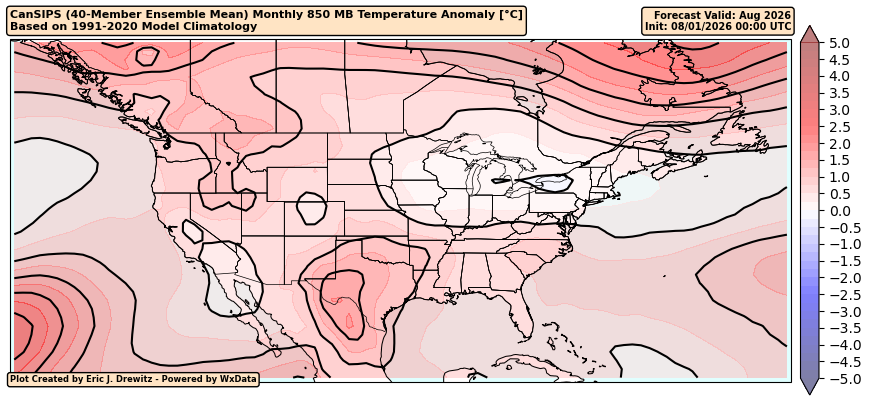

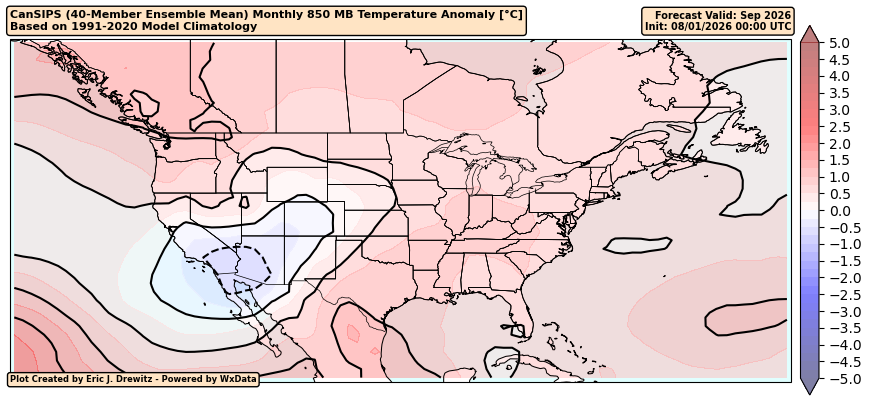

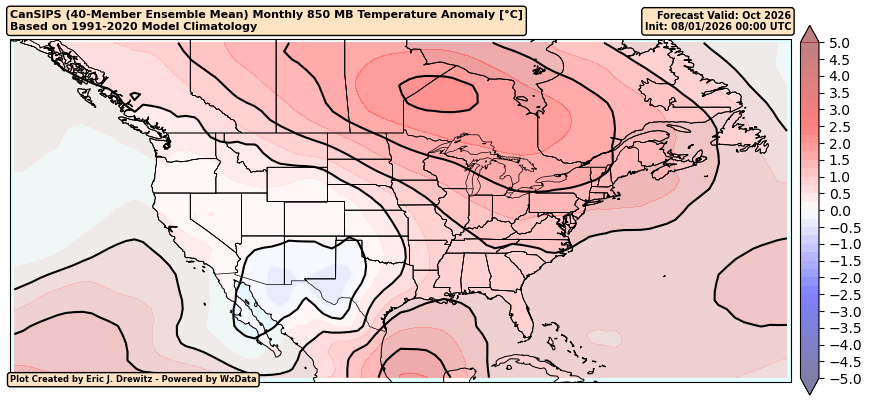

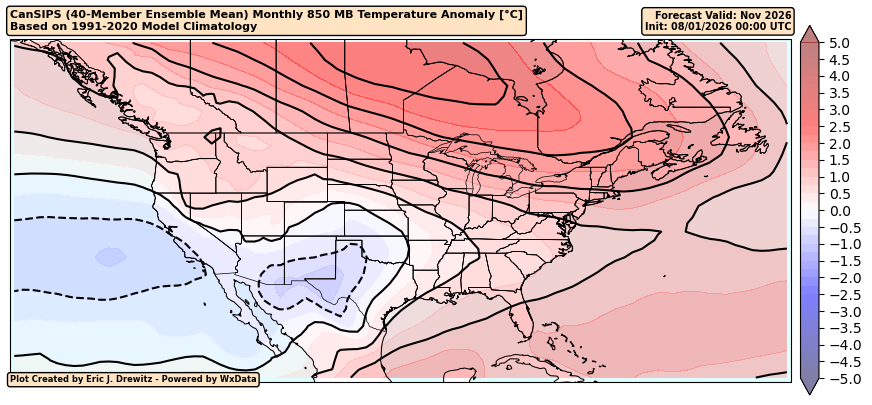

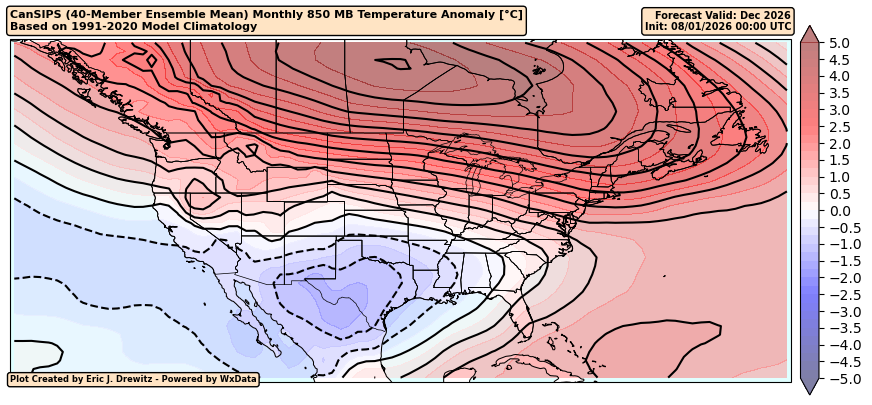

...

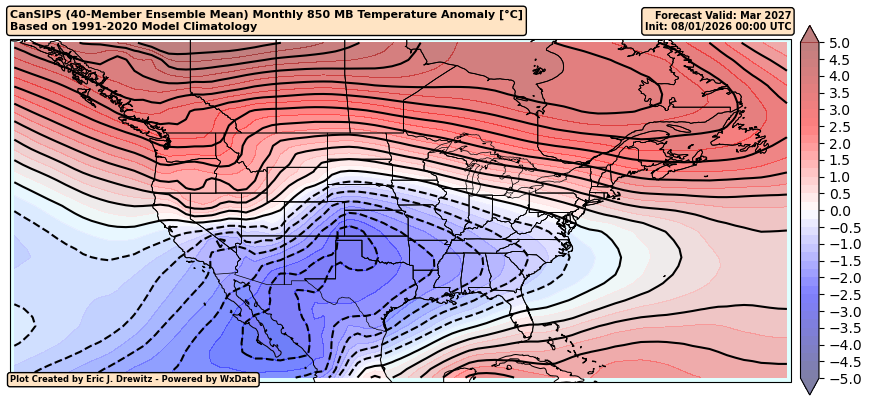

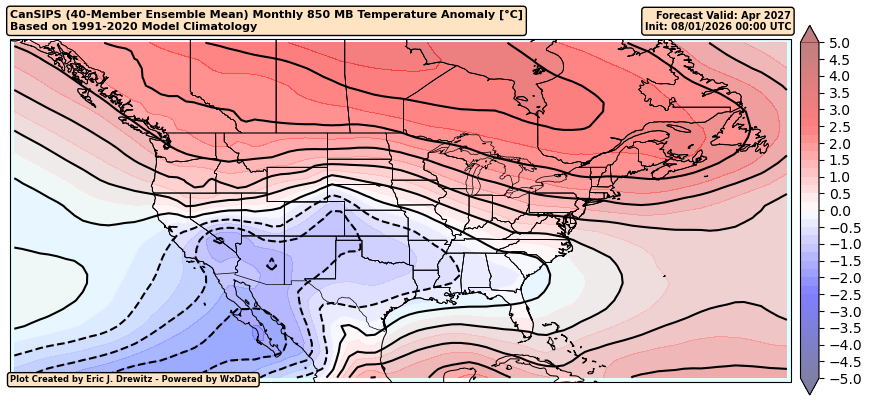

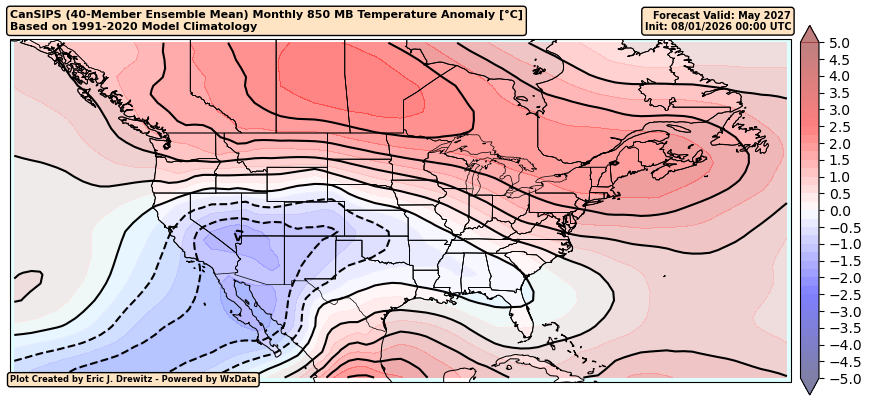

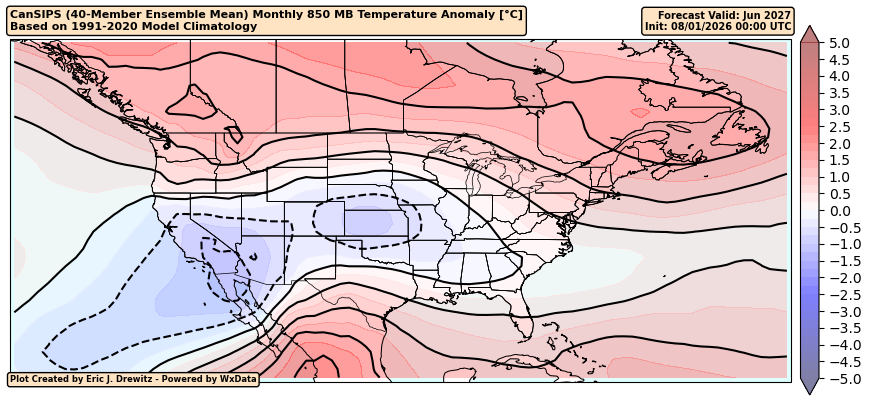

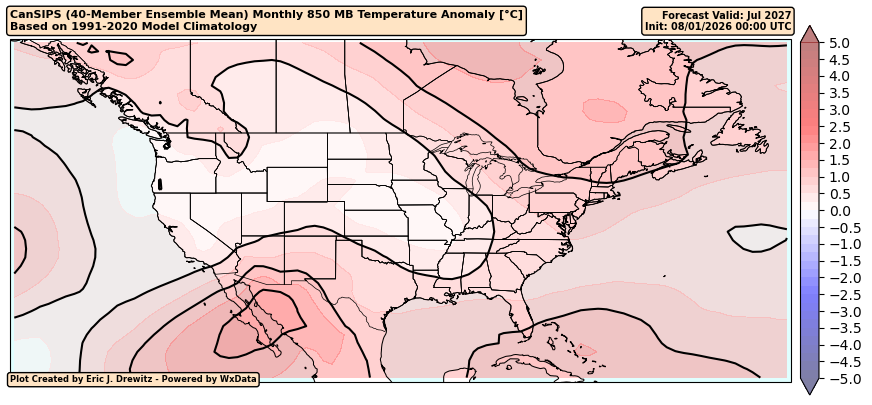

In [17]:
# Create our figure
for i in range(0, len(temperature_forecast['step']), 1):
    fig = plt.figure(figsize=(12,12))
    
    # Create our subplot with a PlateCarree (lat/lon) projection
    ax = fig.add_subplot(1,1,1, projection=ccrs.PlateCarree())
    
    # Set our boundaries in a latlon format of [western_bound, eastern_bound, southern_bound, northern_bound] followed by our PlateCarree projection
    ax.set_extent([-141, -50, 20, 60], ccrs.PlateCarree())
    
    # Add our features to the map 
    # Add our coastlines
    ax.add_feature(cfeature.COASTLINE.with_scale('50m'), linewidth=0.75, zorder=3)
    
    # Add the oceans, land, states, lakes and Canadian provinces and color them light cyan
    ax.add_feature(cfeature.OCEAN, color='lightcyan', zorder=1)
    ax.add_feature(cfeature.LAKES, color='lightcyan', zorder=1)
    ax.add_feature(cfeature.LAND, color='white', zorder=1)
    ax.add_feature(cfeature.STATES, edgecolor='black', linewidth=0.5, zorder=5)
    province_boundaries = cfeature.NaturalEarthFeature(
        category="cultural",
        name="admin_1_states_provinces_lines",
        scale="50m",
        facecolor="none",
        edgecolor="black",
    )
    ax.add_feature(province_boundaries, linewidth=0.5, zorder=5)

    # Plot our contour data of the 850mb temperature difference (Δ°C) between the forecast and 1991-2020 climatology
    ax.contour(temperature_forecast['longitude'], 
                temperature_forecast['latitude'], 
                (temperature_forecast['temperature'][i, :, :] - temperature_hindcast['temperature'][i, :, :]), 
                transform=ccrs.PlateCarree(),
                levels=np.arange(-5, 5.5, 0.5),
                zorder=2,
                alpha=1,
                colors='black')
    
    # Add our filled contours of the 850mb temperature difference (Δ°C) between the forecast and 1991-2020 climatology
    cs = ax.contourf(temperature_forecast['longitude'], 
                   temperature_forecast['latitude'], 
                   (temperature_forecast['temperature'][i, :, :] - temperature_hindcast['temperature'][i, :, :]), 
                   levels=np.arange(-5, 5.25, 0.25),  
                   transform=ccrs.PlateCarree(),
                   alpha=0.5,
                   cmap='seismic',
                   extend='both')
    
    # Create our colorbar of the 850mb temperature difference (Δ°C) between the forecast and 1991-2020 climatology
    fig.colorbar(cs, 
                 shrink=0.4, 
                 pad=0.01,
                 ticks=np.arange(-5, 5.5, 0.5))
    
    # Plot title
    plt.title(f"CanSIPS (40-Member Ensemble Mean) Monthly 850 MB Temperature Anomaly [°C]\nBased on 1991-2020 Model Climatology", 
                   fontsize=8, 
                   fontweight='bold',
                   bbox=dict(boxstyle='round', 
                                facecolor='bisque'),
                   loc='left')
    
    # Extract our valid time as a datetime object
    valid_time = pd.to_datetime(temperature_forecast['valid_time'].values)
    
    # Gets our new forecast hour (eventhough we are plotting the initial frame)
    times = temperature_forecast['step'].values
    # The steps are fixed at an interval of 720 hours, however - a month is not a fixed 720 hour period.
    # To correct this, let's add an additional 720 hours to each step to ensure no repeating months
    # The files go from month 0 through month 11
    forecast_time = valid_time + timedelta(hours=(int(times[i]) + 720))
    # Secondary title for our model runtime
    plt.title(f"Forecast Valid: {forecast_time.strftime('%b %Y')}\nInit: {valid_time.strftime('%m/%d/%Y %H:00')} UTC", 
                    fontsize=7, 
                    fontweight='bold',
                    bbox=dict(boxstyle='round', 
                                facecolor='bisque'),
                     loc='right')

    # Adding my signature on the plot
    ax.text(0, 
            -0.001, 
            f"Plot Created by Eric J. Drewitz - Powered by WxData", 
            transform=ax.transAxes, 
            fontsize=6, 
            fontweight='bold', 
            bbox=dict(boxstyle='round', 
                    facecolor='bisque'))

    plt.show()